In [2]:
# Base packages
import dill
import pickle
import numpy as np
import pandas as pd
import seaborn as sns
from pprint import pprint
from wordcloud import WordCloud
import os,re, nltk, spacy

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# Sklearn
from sklearn.externals import joblib
from sklearn.decomposition import TruncatedSVD
from sklearn.model_selection import GridSearchCV
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.decomposition import LatentDirichletAllocation as LDA
from sklearn.feature_extraction.text import TfidfVectorizer

# Plotting tools
import pyLDAvis
import pyLDAvis.sklearn
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Path
folders = './final/'
file_url = folders + 'lematize_corpus_vec.csv'

model_folders = './models/'
dest_model_file_a = model_folders + 'lda_tfidf_tri_a.pkl'
dest_model_file_b = model_folders + 'lda_tfidf_tri_b.jlb'
dest_model_file_c = model_folders + 'lda_tfidf_tri_c_dill.pkl'

gs_model_bk = './gs_models/tfidf_tri.model'
dest_df = './dataframe/tfidf_tri.csv'
dest_vec = './vectorizer/tfidf_tri.vector'

# Init
nlp = spacy.load("en_core_web_sm",disable=['parser', 'ner'])
GRAMMAGE = (1, 3)
%matplotlib inline

# Custom
%run -i ./python-code/helper.py
%run -i ./python-code/config.py
%run -i ./python-code/nlp_scripts.py

C:\Users\Shaynie\Anaconda3\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [2]:
# https://www.machinelearningplus.com/nlp/topic-modeling-python-sklearn-examples/

In [5]:
frame = pd.read_csv(file_url, sep='|', encoding="utf-8")
frame.head()

,text,list_text,lemma_text
0,People with an irregular heart beat condition...,"['people', 'with', 'an', 'irregular', 'heart',...",peopl irregular heart beat condit should be cl...
1,Politicians in the Catholic Republic of Irelan...,"['politicians', 'in', 'the', 'catholic', 'repu...",politician cathol republ ireland have overwhel...
2,In the winter months temperatures and humidity...,"['in', 'the', 'winter', 'months', 'temperature...",winter month temperatur humid level plummet as...
3,A system of special measures designed to impro...,"['system', 'of', 'special', 'measures', 'desig...",system special measur design improv fail hospi...
4,A can be hard enough to get on your own Add in...,"['can', 'be', 'hard', 'enough', 'to', 'get', '...",can be hard enough get own add challeng sleep ...


In [6]:
frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25737 entries, 0 to 25736
Data columns (total 3 columns):
text          25737 non-null object
list_text     25737 non-null object
lemma_text    25729 non-null object
dtypes: object(3)
memory usage: 603.3+ KB


In [7]:
frame = frame[pd.notnull(frame['lemma_text'])]
frame.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25729 entries, 0 to 25736
Data columns (total 3 columns):
text          25729 non-null object
list_text     25729 non-null object
lemma_text    25729 non-null object
dtypes: object(3)
memory usage: 804.0+ KB


In [8]:
corpus = frame['lemma_text'].values

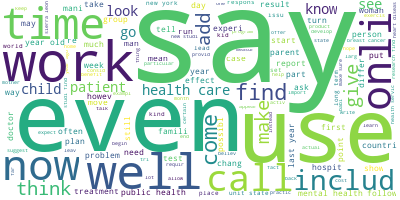

In [7]:
# Join the different processed title together.
long_string = ','.join(corpus)

# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue')

# Generate a word cloud
wordcloud.generate(long_string)

# Visualize the word cloud
wordcloud.to_image()

In [8]:
# Split corpus into TRAIN, TEST, HOLDON
data_train = corpus[:TRAIN_SIZE]
TRAIN_SIZE = TRAIN_SIZE +1
TEST_SIZE = TEST_SIZE + TRAIN_SIZE
data_test = corpus[TRAIN_SIZE:TEST_SIZE]
TEST_SIZE = TEST_SIZE + 1
data_holdon = corpus[TEST_SIZE:]

In [6]:
# Create the Document-Word matrix
vectorizer = TfidfVectorizer(ngram_range = GRAMMAGE,
                             analyzer='word',       
                             min_df=10,                        # minimum reqd occurences of a word 
                             stop_words=M_STOP_WORDS,   # remove stop words
                             lowercase=True,                   # convert all words to lowercase
                             token_pattern='[a-zA-Z0-9]{3,}',  # num chars > 3
                             # max_features=50000,             # max number of uniq words
                            )

data_vectorized = vectorizer.fit_transform(corpus)

In [7]:
# 8. Check the Sparsicity
# Materialize the sparse data
data_dense = data_vectorized.todense()

# Compute Sparsicity = Percentage of Non-Zero cells
print("Sparsicity: ", ((data_dense > 0).sum()/data_dense.size)*100, "%")

MemoryError: 

In [8]:
# Build LDA Model
lda_model = LDA(n_topics=E_TOPICS,       # Number of topics
              max_iter=10,               # Max learning iterations
              learning_method='online',   
              random_state=100,          # Random state
              batch_size=128,            # n docs in each learning iter
              evaluate_every = -1,       # compute perplexity every n iters, default: Don't
              n_jobs = -1,               # Use all available CPUs
             )
lda_output = lda_model.fit_transform(data_vectorized)

print(lda_model)  # Model attributes

C:\Users\Shaynie\Anaconda3\lib\site-packages\sklearn\decomposition\online_lda.py:314: DeprecationWarning: n_topics has been renamed to n_components in version 0.19 and will be removed in 0.21
  DeprecationWarning)


LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7,
             learning_method='online', learning_offset=10.0,
             max_doc_update_iter=100, max_iter=10, mean_change_tol=0.001,
             n_components=10, n_jobs=-1, n_topics=6, perp_tol=0.1,
             random_state=100, topic_word_prior=None,
             total_samples=1000000.0, verbose=0)


In [9]:
# 10
# Log Likelyhood: Higher the better
print("Log Likelihood: ", lda_model.score(data_vectorized))

# Perplexity: Lower the better. Perplexity = exp(-1. * log-likelihood per word)
print("Perplexity: ", lda_model.perplexity(data_vectorized))

# See model parameters
pprint(lda_model.get_params())

Log Likelihood:  -3772179.1047349484
Perplexity:  105288.34364639182
{'batch_size': 128,
 'doc_topic_prior': None,
 'evaluate_every': -1,
 'learning_decay': 0.7,
 'learning_method': 'online',
 'learning_offset': 10.0,
 'max_doc_update_iter': 100,
 'max_iter': 10,
 'mean_change_tol': 0.001,
 'n_components': 10,
 'n_jobs': -1,
 'n_topics': 6,
 'perp_tol': 0.1,
 'random_state': 100,
 'topic_word_prior': None,
 'total_samples': 1000000.0,
 'verbose': 0}


In [11]:
## GridSearchCV
# Define Search Param
search_params = {'n_components': N_COMPONENTS, 'learning_decay': LEARNING_DECAY}

# Init the Model
lda = LDA()

# Init Grid Search Class
model = GridSearchCV(lda, param_grid=search_params,n_jobs=-1)

# Do the Grid Search
model.fit(data_vectorized)

C:\Users\Shaynie\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)


GridSearchCV(cv='warn', error_score='raise-deprecating',
       estimator=LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7,
             learning_method='batch', learning_offset=10.0,
             max_doc_update_iter=100, max_iter=10, mean_change_tol=0.001,
             n_components=10, n_jobs=None, n_topics=None, perp_tol=0.1,
             random_state=None, topic_word_prior=None,
             total_samples=1000000.0, verbose=0),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'n_components': [6, 10, 15, 20, 25, 30, 50], 'learning_decay': ['.3', '.5', '.7', '.9']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [12]:
# Best Model
best_lda_model = model.best_estimator_

# Model Parameters
print("Best Model's Params: ", model.best_params_)

# Log Likelihood Score
print("Best Log Likelihood Score: ", model.best_score_)

# Perplexity
print("Model Perplexity: ", best_lda_model.perplexity(data_vectorized))

Best Model's Params:  {'learning_decay': '.3', 'n_components': 6}
Best Log Likelihood Score:  -1362830.6447237113
Model Perplexity:  108099.64967844391


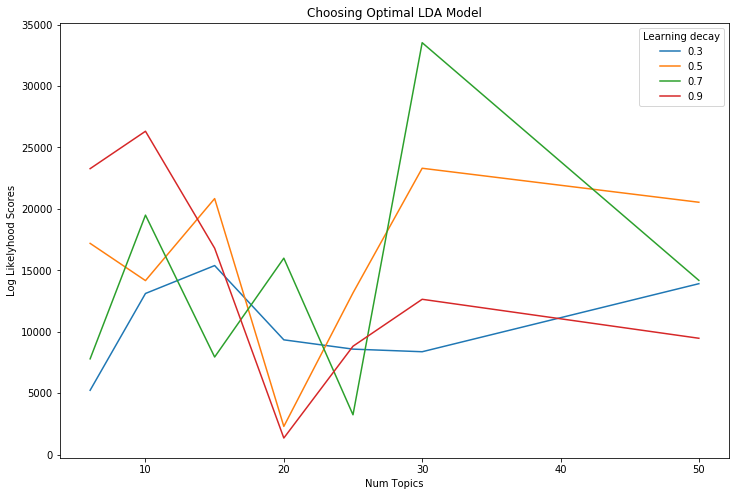

In [13]:
# Get Log Likelyhoods from Grid Search Output
n_topics = search_params['n_components']
learning_decay = LEARNING_DECAY
one_third = len(n_topics)
two_third = one_third*2
three_fourth = one_third*3

gscore = dict(model.cv_results_)
log_likelyhoods_3 = gscore['std_train_score'][0:one_third]
log_likelyhoods_5 = gscore['std_train_score'][one_third:two_third]
log_likelyhoods_7 = gscore['std_train_score'][two_third:three_fourth]
log_likelyhoods_9 = gscore['std_train_score'][three_fourth:]


# log_likelyhoods_5 = [round(gscore.mean_validation_score) for gscore in model.cv_results_ if gscore.parameters['learning_decay']==0.5]
# log_likelyhoods_7 = [round(gscore.mean_validation_score) for gscore in model.cv_results_ if gscore.parameters['learning_decay']==0.7]
# log_likelyhoods_9 = [round(gscore.mean_validation_score) for gscore in model.cv_results_ if gscore.parameters['learning_decay']==0.9]

# Show graph
plt.figure(figsize=(12, 8))
plt.plot(n_topics, log_likelyhoods_3, label='0.3')
plt.plot(n_topics, log_likelyhoods_5, label='0.5')
plt.plot(n_topics, log_likelyhoods_7, label='0.7')
plt.plot(n_topics, log_likelyhoods_9, label='0.9')
plt.title("Choosing Optimal LDA Model")
plt.xlabel("Num Topics")
plt.ylabel("Log Likelyhood Scores")
plt.legend(title='Learning decay', loc='best')
plt.show()


### Saving Models 

In [14]:
# Have: best_lda_model


## ----------------------------------------------------------
## ----------------------------------------------------------
## Pickle
## ----------------------------------------------------------
pickle.dump(best_lda_model,open(dest_model_file_a,'wb'))

## Joblib
## ----------------------------------------------------------
joblib.dump(best_lda_model, dest_model_file_b)

## Dill
## ----------------------------------------------------------
dill.dump(best_lda_model, open(dest_model_file_c,'wb'))

## Vectorizer
## ----------------------------------------------------------
dill.dump(vectorizer, open(dest_vec,'wb'))


## ----------------------------------------------------------
## ----------------------------------------------------------
## Backup GridSearchCV models
## ----------------------------------------------------------
dill.dump(model, open(gs_model_bk,'wb'))

## Best topic
## ----------------------------------------------------------
BEST_TOPICS = model.best_params_['n_components']

### Open files

In [11]:
best_lda_model = dill.load(open(dest_model_file_c,'rb'))
vectorizer = dill.load(open(dest_vec,'rb'))
model = dill.load(open(gs_model_bk,'rb'))

data_vectorized = vectorizer.fit_transform(corpus)

In [12]:
# Create Document - Topic Matrix
lda_output = best_lda_model.transform(data_vectorized)

# column names
topicnames = ["Topic" + str(i) for i in range(model.best_params_['n_components'])]

# index names
docnames = ["Doc" + str(i) for i in range(len(corpus))]

# Make the pandas dataframe
df_document_topic = pd.DataFrame(np.round(lda_output, 2), columns=topicnames, index=docnames)

# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic

# Styling
def color_green(val):
    color = 'green' if val > .1 else 'black'
    return 'color: {col}'.format(col=color)

def make_bold(val):
    weight = 700 if val > .1 else 400
    return 'font-weight: {weight}'.format(weight=weight)

# Apply Style
df_document_topics = df_document_topic.head(15).style.applymap(color_green).applymap(make_bold)
df_document_topics

,Topic0,Topic1,Topic2,Topic3,Topic4,Topic5,dominant_topic
Doc0,0.01,0.01,0.94,0.01,0.01,0.01,2
Doc1,0.03,0.03,0.87,0.03,0.03,0.03,2
Doc2,0.01,0.01,0.94,0.01,0.01,0.01,2
Doc3,0.01,0.01,0.94,0.01,0.01,0.01,2
Doc4,0.01,0.01,0.96,0.01,0.01,0.01,2
Doc5,0.01,0.01,0.94,0.01,0.01,0.01,2
Doc6,0.01,0.01,0.7,0.01,0.27,0.01,2
Doc7,0.02,0.02,0.9,0.02,0.02,0.02,2
Doc8,0.02,0.02,0.92,0.02,0.02,0.02,2
Doc9,0.01,0.01,0.94,0.01,0.01,0.01,2


In [13]:
df_topic_distribution = df_document_topic['dominant_topic'].value_counts().reset_index(name="Num Documents")
df_topic_distribution.columns = ['Topic Num', 'Num Documents']
df_topic_distribution

,Topic Num,Num Documents
0,2,23030
1,4,1082
2,1,844
3,3,322
4,0,250
5,5,201


In [ ]:
df_document_topic.to_csv(dest_df, sep='|')

In [18]:
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(best_lda_model, data_vectorized, vectorizer, mds='tsne')
panel

C:\Users\Shaynie\Anaconda3\lib\site-packages\pyLDAvis\_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=                x          y  topics  cluster       Freq
topic                                                   
2       59.170326   9.767591       1        1  79.921521
4       -3.885003 -20.933105       2        1   6.930129
1       10.487077  60.249828       3        1   5.026627
3       68.883179 -59.688744       4        1   3.228069
0       92.137955  71.668007       5        1   2.503206
5      128.228668  -2.458229       6        1   2.390447, topic_info=       Category        Freq                  Term       Total  loglift  \
term                                                                     
163247  Default  128.000000                 virus  128.000000  30.0000   
75110   Default  155.000000                infect  155.000000  29.0000   
106497  Default   93.000000              outbreak   93.000000  28.0000   
20387   Default  191.000000                  case  191.000000  27.0000   
53790   Default  116.000000                   fat  116.000000  26.0000   
168661  Default   99.000000                worker   99.000000  25.0000   
103982  Default  105.000000                offici  105.000000  24.0000   
143759  Default   74.000000                spread   74.000000  23.0000   
161652  Default  192.000000                vaccin  192.000000  22.0000   
166865  Default   58.000000                  west   58.000000  21.0000   
3684    Default   55.000000                africa   55.000000  20.0000   
32546   Default  134.000000               countri  134.000000  19.0000   
41482   Default  243.000000                diseas  243.000000  18.0000   
84386   Default   43.000000               liberia   43.000000  17.0000   
17875   Default  122.000000                calori  122.000000  16.0000   
123220  Default  103.000000              question  103.000000  15.0000   
121218  Default   63.000000               protein   63.000000  14.0000   
104146  Default   47.000000                   oil   47.000000  13.0000   
139081  Default   38.000000                sierra   38.000000  12.0000   
30636   Default   61.000000               contact   61.000000  11.0000   
68830   Default   66.000000                   hiv   66.000000  10.0000   
83799   Default   37.000000                  leon   37.000000   9.0000   
139082  Default   37.000000           sierra leon   37.000000   8.0000   
69803   Default  292.000000                hospit  292.000000   7.0000   
157297  Default   56.000000                travel   56.000000   6.0000   
168965  Default  122.000000                 world  122.000000   5.0000   
64987   Default  474.000000                health  474.000000   4.0000   
21433   Default   66.000000                   cdc   66.000000   3.0000   
166866  Default   32.000000           west africa   32.000000   2.0000   
66476   Default  121.000000               healthi  121.000000   1.0000   
...         ...         ...                   ...         ...      ...   
94022    Topic6    0.486685              meet fit    1.114390   2.9052   
147299   Topic6    0.297370  student london south    0.672275   2.9180   
75004    Topic6    0.397429       industri sector    0.908247   2.9072   
13937    Topic6    1.037597              bing eat    2.731751   2.7657   
103675   Topic6    0.412867               ofeibea    0.970758   2.8787   
132992   Topic6    0.506045             role nurs    1.264203   2.8181   
27002    Topic6    0.479183        combin exercis    1.243917   2.7798   
44110    Topic6    0.354825      dri roast peanut    0.831177   2.8825   
160635   Topic6    0.340817       univers discuss    0.797515   2.8835   
99295    Topic6    0.386478            need parti    1.002979   2.7800   
164302   Topic6    0.988682               wansink    5.470163   2.0230   
122231   Topic6    0.530265          public debat    1.917579   2.4482   
102229   Topic6    0.543503       npr scott simon    2.104241   2.3800   
43340    Topic6    0.733611        domest violenc    6.650109   1.5293   
21415    Topic6    0.73

In [19]:
# Topic-Keyword Matrix
df_topic_keywords = pd.DataFrame(best_lda_model.components_)

# Assign Column and Index
df_topic_keywords.columns = vectorizer.get_feature_names()
df_topic_keywords.index = topicnames

# View
df_topic_keywords

,aaa,aafter,aall,aalmost,aan,aand,aani,aanyth,aap,aap committe,...,zucchini round,zucchini round zucchini,zucchini salt,zucchini salt ground,zucchini veggi,zucchini veggi tangi,zucker,zuckerman,zumba,zumba class
Topic0,0.166670,0.166669,0.166669,0.166670,0.166669,0.166669,0.166670,0.166670,0.166669,0.166670,...,0.166667,0.166667,0.166668,0.166667,0.166667,0.166667,0.166670,0.166669,0.166669,0.166669
Topic1,0.166669,0.166669,0.166669,0.166670,0.166669,0.166689,0.166669,0.167563,0.166669,0.166670,...,0.565901,0.349983,0.628801,0.349983,0.349983,0.349983,0.166669,0.166669,0.166669,0.166671
Topic2,1.171516,1.114998,2.118003,0.650511,1.979848,4.000862,0.828027,0.620533,3.100929,0.625355,...,0.166771,0.166677,0.166669,0.166677,0.166677,0.166677,0.993346,1.677314,2.691148,1.335308
Topic3,0.166670,0.166669,0.166669,0.166670,0.166669,0.166669,0.166670,0.166670,0.166669,0.166670,...,0.166667,0.166667,0.166668,0.166667,0.166667,0.166667,0.166670,0.166669,0.166669,0.166669
Topic4,0.166725,0.166669,0.166668,0.166669,0.166715,0.166668,0.166669,0.166669,0.166855,0.166669,...,0.166667,0.166667,0.166667,0.166667,0.166667,0.166667,0.166669,0.166668,0.166668,0.166668
Topic5,0.166670,0.166669,0.166669,0.166670,0.166669,0.166669,0.166670,0.166670,0.166670,0.166670,...,0.166667,0.166667,0.166668,0.166667,0.166667,0.166667,0.166670,0.166669,0.166985,0.166669


In [20]:
# Show top n keywords for each topic
topic_keywords = show_topics(vectorizer=vectorizer, lda_model=best_lda_model, n_words=18)        

# Topic - Keywords Dataframe
df_topic_keywords = pd.DataFrame(topic_keywords)
df_topic_keywords.columns = ['Word '+str(i) for i in range(df_topic_keywords.shape[1])]
df_topic_keywords.index = ['Topic '+str(i) for i in range(df_topic_keywords.shape[0])]
df_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14,Word 15,Word 16,Word 17
Topic 0,hookah,ahp,tortur,omega,cigarett,fish,youar,want know come,final solv,everyon want know,rise star,final solv hard,movement late come,movement late,layoff downsiz,excit promot,rise star final,excit promot rise
Topic 1,pepper,recip,fat,oil,dish,chees,protein,oliv,flavor,submit question,question submit question,question submit,health question submit,salt,oliv oil,fiber,health question,tomato
Topic 2,health,peopl,patient,studi,year,research,care,child,drug,cancer,hospit,make,woman,new,time,medic,doctor,food
Topic 3,mental,mental health,low fat,fat,cornflak,milk,egg low,egg low fat,low,wheat bread,low fat milk,fat milk,breakfast,chantix,servic,butter,wheat,bread
Topic 4,virus,outbreak,infect,liberia,africa,sierra,sierra leon,leon,west,west africa,guinea,spread,case,mer,worker,offici,quarantin,contact
Topic 5,nurs,bing eat,wansink,julieanna,nhs,navig,ccgs,domest violenc,honour,nomin,bing,social care,wansink write,frieden,face nurs,violenc,enter profess,npr scott simon


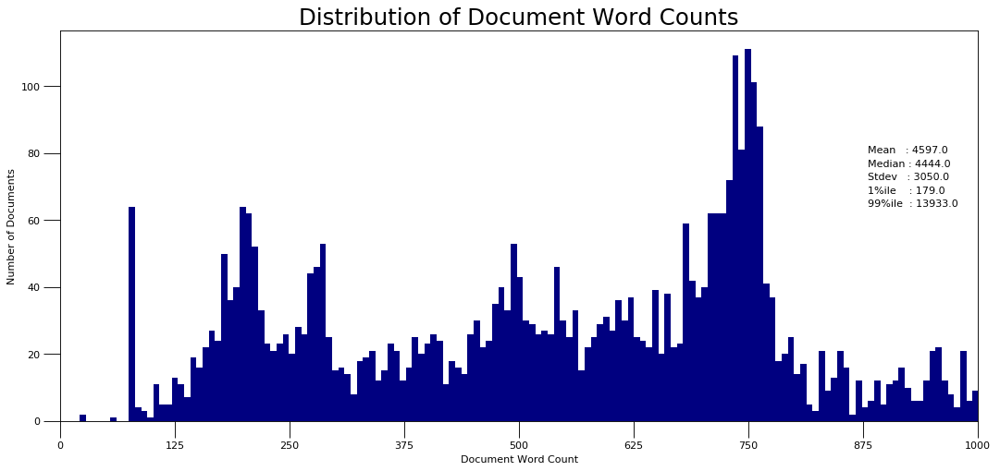

In [21]:
doc_lens = [len(d) for d in frame['list_text'].values]

# Plot
plt.figure(figsize=(16,7), dpi=80)
plt.hist(doc_lens, bins = 10000, color='navy')
plt.text(880, 80, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(880, 76, "Median : " + str(round(np.median(doc_lens))))
plt.text(880, 72, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(880, 68, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(880, 64, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 1000), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,1000,9))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=22))
plt.show()

In [21]:
unseem_data = '''
Ultra-processed foods - such as chicken nuggets, ice cream and breakfast cereals - have been linked to early death and poor health, scientists say. 
Researchers in France and Spain say the amount of such food being eaten has soared.
Their studies are not definite proof of harm but do come hot on the heels of trials suggesting ultra-processed foods 
.
Experts expressed caution but called for further investigation. 
The term comes from a way of classifying food by how much industrial processing it has been through.
The lowest category is "unprocessed or minimally processed foods", which include: • fruit • vegetables • milk • meat • legumes such as lentils • seeds • grains such as rice • eggs
"Processed foods" have been altered to make them last longer or taste better - generally using salt, oil, sugar or fermentation.
This category includes: • cheese • bacon • home-made bread • tinned fruit and vegetables • smoked fish • beer
Then come "ultra-processed foods", which have been through more substantial industrial processing and often have long ingredient lists on the packet, including added preservatives, sweeteners or colour enhancers. 
If a product contains more than five ingredients, it is probably ultra-processed, says Prof Maira Bes-Rastrollo, of the University of Navarra, citing a maxim.
Examples include: • processed meat such as sausages and hamburgers • breakfast cereals or cereal bars • instant soups • sugary fizzy drinks • chicken nuggets • cake • chocolate • ice cream • mass-produced bread • many "ready to heat" meals such as pies and pizza | meal-replacement shakes 
, by the University of Navarra, in Spain, followed 19,899 people for a decade and assessed their diet every other year. There were 335 deaths during the study.
But for every 10 deaths among those eating the least ultra-processed food, there were 16 deaths among those eating the most (more than four portions a day).
, by the University of Paris, followed 105,159 people for five years and assessed their diet twice a year.
It showed those eating more ultra-processed food had worse heart health. 
Rates of cardiovascular disease were 277 per 100,000 people per year among those eating the most ultra-processed food, compared with 242 per 100,000 among those eating the least. 
The rapid increase of ultra-processed foods over less processed foods, "may drive a substantial burden of cardiovascular diseases in the next decades," said Dr Mathilde Touvier, of the University of Paris.
"[The] evidence is accumulating," said Dr Touvier, noting "increasing numbers of independent studies". Prof Bes-Rastrollo said she was "very certain" ultra-processed foods were bad for health.
Last year, a link was made with 
.
The challenge is being 100% sure. The studies have spotted a pattern between highly processed food and poor health but they cannot prove that one causes the other. 
Those who ate the most ultra-processed food were also more likely to have other unhealthy behaviours, such as smoking, which the researchers tried to account for. 
But there's no guarantee everything relevant was covered, says Kevin McConway, a professor of statistics at The Open University.
"These studies do increase my confidence that there's something real behind these associations - but I'm still far from sure."
The first trial of ultra-processed foods showed they led people to eat more and put on weight. 
Researchers at the US National Institutes of Health monitored every morsel of food that volunteers ate for a month.
And when given ultra-processed food, they ate 500 calories a day more than when they were given unprocessed meals.
Other suggestions include: 
These ideas still need researching.
While the term ultra-processed food may be new, the health advice will be very familiar: adopt a Mediterranean-style diet.
Such a diet includes plenty of minimally or unprocessed foods, such as fruit, vegetables, fish, nuts and seeds, beans, lentils and wholegrains, said Victoria Taylor, senior dietician at the British Heart Foundation.
"This, along with exercising regularly and not smoking, has been shown to be beneficial for lowering risk of heart and circulatory disease."
Measures such as taxation and marketing restrictions on ultra-processed foods, should be considered, said Prof Bes-Rastrollo, given the weight of evidence. 
There are certainly a lot of critics. 
The labelling of food as ultra-processed could be inconsistent, said Dr Gunter Kuhnle, an expert in nutrition and health at the University of Reading
"It is also not obvious why salami is considered to be ultra-processed, yet cheese, which often requires considerably more processing steps and additives, is not.  The classification combines a wide range of foods with very different potential impacts on health, which limits its usefulness as a basis for recommendations."
The studies were published in the British Medical Journal.
'''

In [22]:
# Define function to predict topic for a given text document.

# Predict the topic
# for text in data_test:
#     topic, prob_scores = predict_topic(text = text)
#     print(topic)
topic, prob_scores = predict_topic(unseem_data)
print(topic)
pprint(prob_scores)

[[0.01269764 0.01273383 0.93634277 0.01268553 0.01283316 0.01270707]] 2
['health', 'peopl', 'patient', 'studi', 'year', 'research', 'care', 'child', 'drug', 'cancer', 'hospit', 'make', 'woman', 'new', 'time', 'medic', 'doctor', 'food']
array([[0.01269764, 0.01273383, 0.93634277, 0.01268553, 0.01283316,
        0.01270707]])


### Fitting with KMeans

Component's weights: 
 [[ 0.02  0.02  1.    0.02  0.04  0.02]
 [ 0.02  0.12 -0.05  0.02  0.99  0.02]]
Perc of Variance Explained: 
 [0.44 0.22]


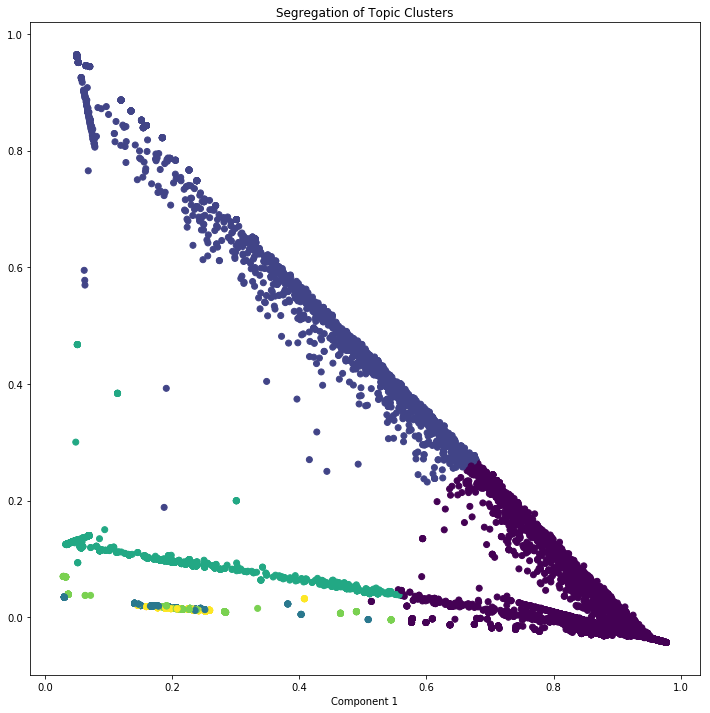

In [23]:
# Construct the k-means clusters
from sklearn.cluster import KMeans
clusters = KMeans(n_clusters=BEST_TOPICS, random_state=100).fit_predict(lda_output)

# Build the Singular Value Decomposition(SVD) model
svd_model = TruncatedSVD(n_components=2)  # 2 components
lda_output_svd = svd_model.fit_transform(lda_output)

# X and Y axes of the plot using SVD decomposition
x = lda_output_svd[:, 0]
y = lda_output_svd[:, 1]

# Weights for the 15 columns of lda_output, for each component
print("Component's weights: \n", np.round(svd_model.components_, 2))

# Percentage of total information in 'lda_output' explained by the two components
print("Perc of Variance Explained: \n", np.round(svd_model.explained_variance_ratio_, 2))

# Plotting clusters
plotting_clusters(x, y, clusters)

In [24]:
from sklearn.metrics.pairwise import euclidean_distances

def similar_documents(text, doc_topic_probs, documents = corpus, nlp=nlp, top_n=5, verbose=False):
    topic, x  = predict_topic(text)
    dists = euclidean_distances(x.reshape(1, -1), doc_topic_probs)[0]
    doc_ids = np.argsort(dists)[:top_n]
    if verbose:        
        print("Topic KeyWords: ", topic)
        print("Topic Prob Scores of text: ", np.round(x, 1))
        print("Most Similar Doc's Probs:  ", np.round(doc_topic_probs[doc_ids], 1))
    return doc_ids, np.take(documents, doc_ids)

In [25]:
# Get similar documents
doc_ids, docs = similar_documents(text=unseem_data, doc_topic_probs=lda_output, documents = corpus, top_n=1, verbose=True)
print('\n', docs[0][:500])

[[0.01269764 0.01273383 0.93634277 0.01268553 0.01283316 0.01270707]] 2
Topic KeyWords:  ['health', 'peopl', 'patient', 'studi', 'year', 'research', 'care', 'child', 'drug', 'cancer', 'hospit', 'make', 'woman', 'new', 'time', 'medic', 'doctor', 'food']
Topic Prob Scores of text:  [[0.  0.  0.9 0.  0.  0. ]]
Most Similar Doc's Probs:   [[0.  0.  0.9 0.  0.  0. ]]

 pregnant woman should take low dose aspirin daili reduc chanc develop pre eclampsia be high risk life threaten disord influenti govern panel say monday unit state prevent servic task forcea draft recommend follow grow scientif consensus low dose may be benefici high risk woman offspr low dose aspirin reduc risk pre eclampsia percent clinic trial accord underpin new recommend be publish annal intern medicin low dose aspirin also reduc risk prematur birth percent intrauterin growth restrict condit


### Fitting with DBSCAN

In [14]:
# Construct the DBSCAN
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# ss = StandardScaler()
# X = ss.fit_transform(lda_output)

dbscan_clusters = DBSCAN(eps=0.123, min_samples = 4).fit_predict(lda_output)

# Build the Singular Value Decomposition(SVD) model
svd_model = TruncatedSVD(n_components=2)  # 2 components
lda_output_svd = svd_model.fit_transform(lda_output)

# X and Y axes of the plot using SVD decomposition
x = lda_output_svd[:, 0]
y = lda_output_svd[:, 1]

# Plotting clusters
plotting_clusters(x, y, dbscan_clusters)

SystemError: <built-in function dbscan_inner> returned a result with an error set